<a href="https://colab.research.google.com/github/Karam11ei/Container_Klasse/blob/master/TyCode_OnderLabel_2_Bilder.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install torch torchvision pillow

In [ ]:

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
import json
import time
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import matplotlib.pyplot as plt
from datetime import datetime
from sklearn.metrics import precision_score, recall_score, f1_score  # Importiere Metriken

In [ ]:
# Configuration
image_size = (24, 24)  # Image dimensions
batch_size = 20
num_epochs = ""
learning_rate = 0.0001
classes = ["Rot", "Schwarz", "Silber", "Leer"]  # Example classes
num_classes = len(classes)



In [ ]:

# Ergebnisse speichern in einem Ordner mit Datum und Uhrzeit
current_time = datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
results_dir = f"/content/drive/MyDrive/IndLab/results_{current_time}"
os.makedirs(results_dir, exist_ok=True)  # Stelle sicher, dass der Ordner existiert

In [ ]:

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:

# Custom Dataset class
class RingDataset(Dataset):
    def __init__(self, image_dir, transform=None):
        self.image_dir = image_dir
        self.transform = transform
        self.images = []
        self.labels = []

        # Load images and labels
        for label, class_name in enumerate(classes):
            class_dir = os.path.join(image_dir, class_name)
            for img_name in os.listdir(class_dir):
                img_path = os.path.join(class_dir, img_name)
                self.images.append(img_path)
                self.labels.append(label)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = self.images[idx]
        label = self.labels[idx]
        try:
            image = Image.open(img_path).convert("RGB")
            if self.transform:
                image = self.transform(image)
            return image, label
        except Exception as e:
            print(f"Fehler beim Laden des Bildes {img_path}: {e}")
            return torch.zeros(3, *image_size), label

        return image, label

In [ ]:
# Transformations
transform = transforms.Compose([
    transforms.Resize(28),  # Größere Eingabedimension
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

In [ ]:
# Dataset and DataLoader
train_dataset = RingDataset(image_dir="/content/drive/MyDrive/IndLab/train", transform=transform)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

test_dataset = RingDataset(image_dir="/content/drive/MyDrive/IndLab/test", transform=transform)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    """  """
    Ein einfaches Convolutional Neural Network (CNN) zur Bildklassifikation.
    
    Layer-Übersicht:
    - conv1: Faltet die Eingangsbilder mit 3 Eingangskanälen (RGB) und erzeugt 16 Filterkarten
    - pool: MaxPooling reduziert die Dimensionen um die Hälfte
    - conv2: Erzeugt 32 Filterkarten mit der gleichen Technik
    - fc1: Vollständig verbundener Layer zur Reduktion der Features
    - fc2: Endgültiger Klassifikations-Layer
    """  """  """

In [ ]:
# Neural Network Model
class SimpleCNN(nn.Module):
    def __init__(self, num_classes):
        super(SimpleCNN, self).__init__()

        # 🚀 Verbesserte Convolutional-Layer mit BatchNorm und ReLU
        self.conv1 = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU()
        )

        self.conv2 = nn.Sequential(
            nn.Conv2d(16, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU()
        )

        self.pool = nn.MaxPool2d(2, 2)
        self.fc1 = nn.Linear(32 * 6 * 6, 128)
        self.fc2 = nn.Linear(128, num_classes)

    def forward(self, x):
        x = self.pool(self.conv1(x))
        x = self.pool(self.conv2(x))
        x = x.view(-1, 32 * 6 * 6)
        x = torch.relu(self.fc1(x))
        x = self.fc2(x)
        return x


In [ ]:
model = SimpleCNN(num_classes=num_classes).to(device)

# Loss and Optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)


In [ ]:
model_weights_path = "/content/drive/MyDrive/IndLab/modeLLL_24_03.pth"

if os.path.exists(model_weights_path):
      print("Loading saved model weights...")
      map_location = torch.device("cuda" if torch.cuda.is_available() else "cpu")
      #model.load_state_dict(torch.load(model_weights_path, map_location=map_location))
      print("Model weights loaded successfully.")

Loading saved model weights...
Model weights loaded successfully.


In [ ]:
# Testing Loop
def test():
    model.eval()
    correct = 0
    total = 0
    start_time = time.time()
    all_labels = []
    all_predictions = []


    with torch.no_grad():
        for batch_idx, (images, labels) in enumerate(test_loader):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)

            all_labels.extend(labels.cpu().numpy())
            all_predictions.extend(predicted.cpu().numpy())

            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            batch_accuracy = 100 * (predicted == labels).sum().item() / labels.size(0)
            print(f"Test -- Batch {batch_idx + 1}/{len(test_loader)} - Accuracy: {batch_accuracy:.2f}%")



    precision = precision_score(all_labels, all_predictions, average="weighted")
    recall = recall_score(all_labels, all_predictions, average="weighted")
    f1 = f1_score(all_labels, all_predictions, average="weighted")

    accuracy = 100 * correct / total
    print(f"\nOverall Accuracy: {accuracy:.2f}%")

    print(f"Präzision: {precision:.4f}, Recall: {recall:.4f}, F1-Score: {f1:.4f}")


    elapsed_time = time.time() - start_time
    print(f"Testing completed in {elapsed_time:.2f} seconds")

    # Save test accuracy
    with open(os.path.join(results_dir, "test_results.json"), "w") as f:
        json.dump({"accuracy": accuracy}, f)
    print("Test results saved to test_results.json")

In [ ]:

# Training Loop
def train():
    model.train()
    training_losses = []
    start_time = time.time()
    for epoch in range(num_epochs):
        running_loss = 0.0
        for batch_idx, (images, labels) in enumerate(train_loader):
        #for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
            print(f"Train -- Epoch {epoch + 1}/{num_epochs}, Batch {batch_idx + 1}/{len(train_loader)} - Loss: {loss.item():.4f}")

        epoch_loss = running_loss / len(train_loader)
        training_losses.append(epoch_loss)
        print(f"Epoch {epoch + 1}/{num_epochs}, Loss: {epoch_loss:.4f}")

    # Save training losses
    with open(os.path.join(results_dir, "training_losses.json"), "w") as f:
        json.dump(training_losses, f)
    print("Training losses saved to training_losses.json")

    elapsed_time = time.time() - start_time
    print(f"\nTraining completed in {elapsed_time:.2f} seconds")

    # Save model parameters
    torch.save(model.state_dict(), model_weights_path)
    print("Model parameters saved to model.pth")

# Test Function for Unlabeled Images with Terminal Output

In [ ]:
# Test Function for Unlabeled Images

def test_unlabeled_images(image_dir):
    correct = 0
    total = 0
    model.eval()
    predictions = {}
    start_time = time.time()

    # Lade die Bilder ohne Labels
    for img_name in os.listdir(image_dir):
        img_path = os.path.join(image_dir, img_name)

        image = Image.open(img_path).convert("RGB")

        plt.figure(figsize=(6, 6))  # Optional: Größe des Anzeigefensters einstellen
        plt.imshow(image)
        plt.title(f"Image: {img_path.split('/')[-1]}")  # Zeigt den Dateinamen an
        plt.axis("off")  # Entfernt Achsen
        plt.show()


        # Wende die gleichen Transformationen an wie im Training
        if transform:
            image = transform(image)

        image = image.unsqueeze(0).to(device)  # Batch-Dimension hinzufügen

        # Vorhersage
        with torch.no_grad():
            outputs = model(image)
            _, predicted = torch.max(outputs, 1)
            predicted_class = classes[predicted.item()]
            predictions[img_name] = predicted_class

            #total += labels.size(0)
            #correct += (predicted == labels).sum().item()

            # Zeige das Ergebnis im Terminal
            print(f"{img_name}: Predicted class - {predicted_class}")

  #  accuracy = 100 * correct / total
  #  print(f"\nOverall Accuracy: {accuracy:.2f}%")

    elapsed_time = time.time() - start_time
    print(f"\nProcessed {len(predictions)} images in {elapsed_time:.2f} seconds")

    # Speichere die Vorhersagen
    with open(os.path.join(results_dir, "unlabeled_predictions.json"), "w") as f:
        json.dump(predictions, f, indent=4)
    print("Predictions saved to unlabeled_predictions.json")

Bitte geben Sie die Anzahl der Trainings-Epochen ein: 30
Train -- Epoch 1/30, Batch 1/94 - Loss: 1.4106
Train -- Epoch 1/30, Batch 2/94 - Loss: 1.3374
Train -- Epoch 1/30, Batch 3/94 - Loss: 1.3011
Train -- Epoch 1/30, Batch 4/94 - Loss: 1.3740
Train -- Epoch 1/30, Batch 5/94 - Loss: 1.1741
Train -- Epoch 1/30, Batch 6/94 - Loss: 1.3374
Train -- Epoch 1/30, Batch 7/94 - Loss: 1.2042
Train -- Epoch 1/30, Batch 8/94 - Loss: 1.2719
Train -- Epoch 1/30, Batch 9/94 - Loss: 1.1932
Train -- Epoch 1/30, Batch 10/94 - Loss: 1.1061
Train -- Epoch 1/30, Batch 11/94 - Loss: 1.4523
Train -- Epoch 1/30, Batch 12/94 - Loss: 1.4585
Train -- Epoch 1/30, Batch 13/94 - Loss: 1.2192
Train -- Epoch 1/30, Batch 14/94 - Loss: 1.3493
Train -- Epoch 1/30, Batch 15/94 - Loss: 1.2026
Train -- Epoch 1/30, Batch 16/94 - Loss: 1.2636
Train -- Epoch 1/30, Batch 17/94 - Loss: 1.0030
Train -- Epoch 1/30, Batch 18/94 - Loss: 1.2768
Train -- Epoch 1/30, Batch 19/94 - Loss: 1.1573
Train -- Epoch 1/30, Batch 20/94 - Loss:

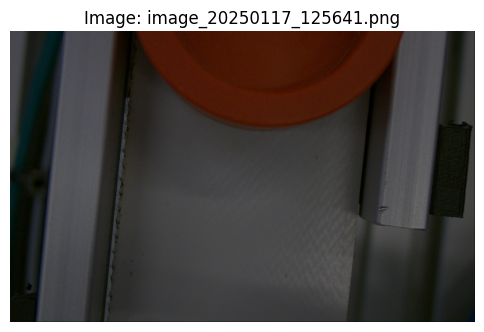

image_20250117_125641.png: Predicted class - Rot


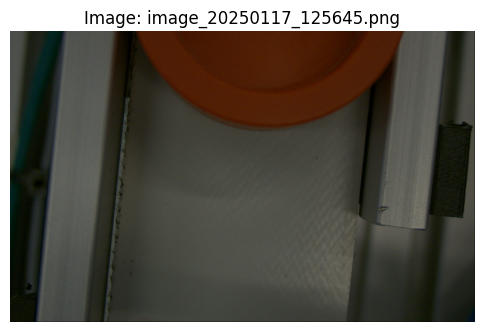

image_20250117_125645.png: Predicted class - Rot


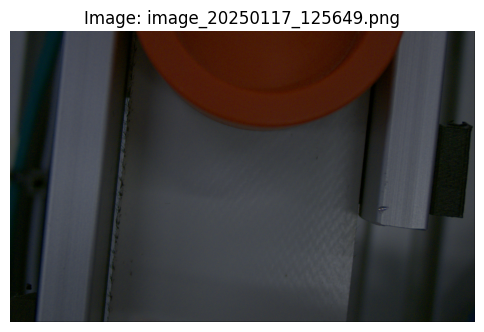

image_20250117_125649.png: Predicted class - Rot


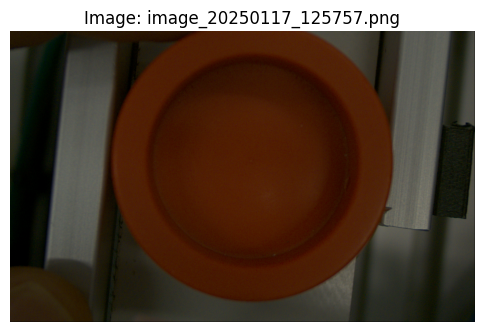

image_20250117_125757.png: Predicted class - Rot


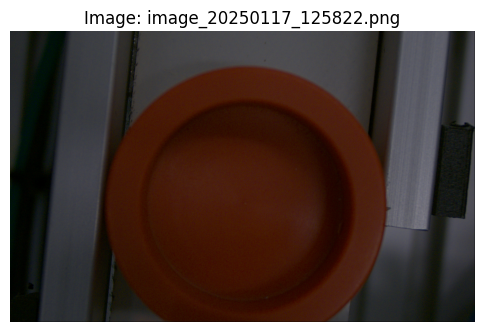

image_20250117_125822.png: Predicted class - Rot


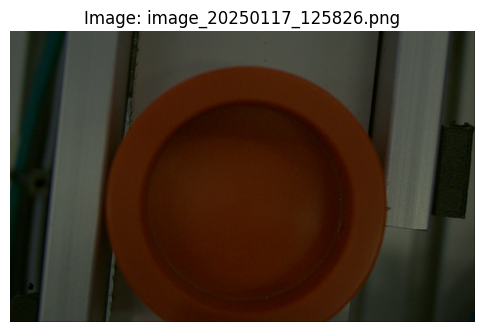

image_20250117_125826.png: Predicted class - Rot


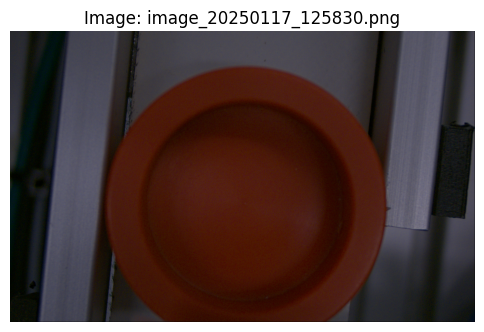

image_20250117_125830.png: Predicted class - Rot


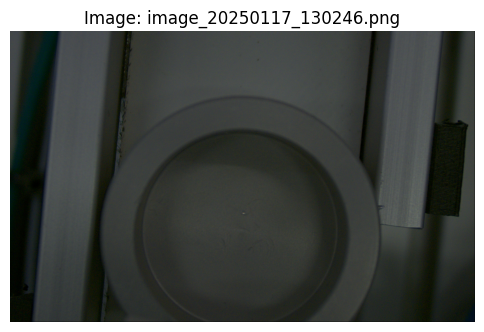

image_20250117_130246.png: Predicted class - Silber


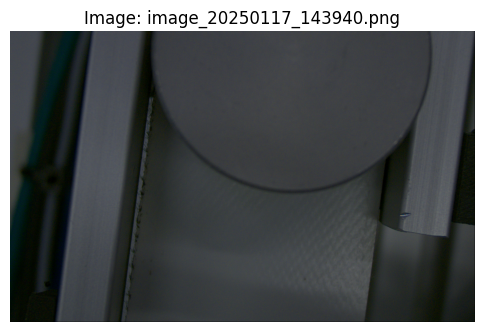

image_20250117_143940.png: Predicted class - Silber


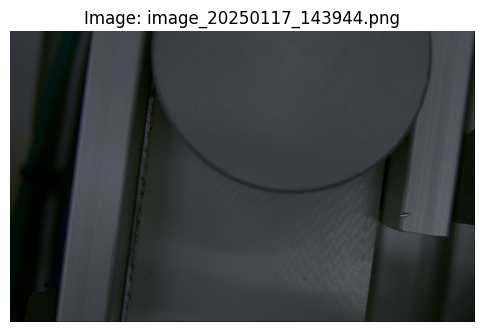

image_20250117_143944.png: Predicted class - Silber


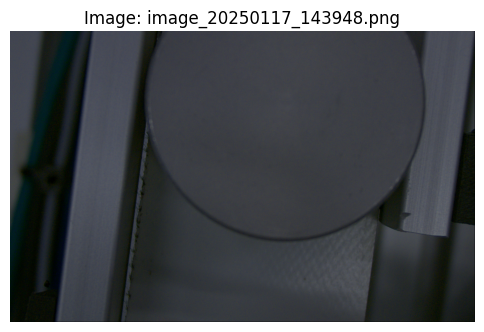

image_20250117_143948.png: Predicted class - Silber


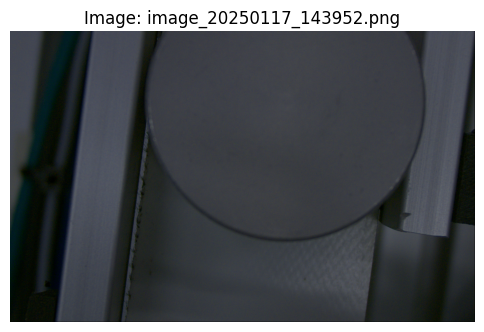

image_20250117_143952.png: Predicted class - Silber


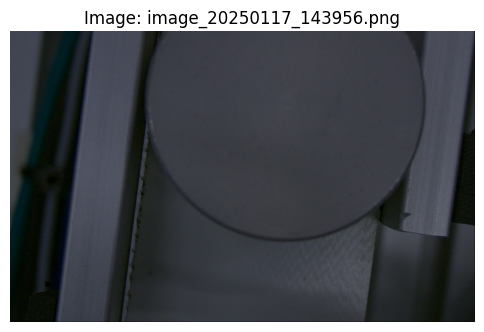

image_20250117_143956.png: Predicted class - Silber


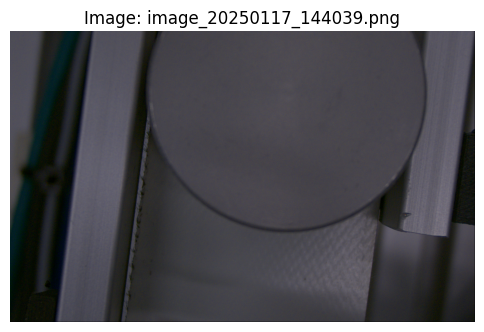

image_20250117_144039.png: Predicted class - Silber


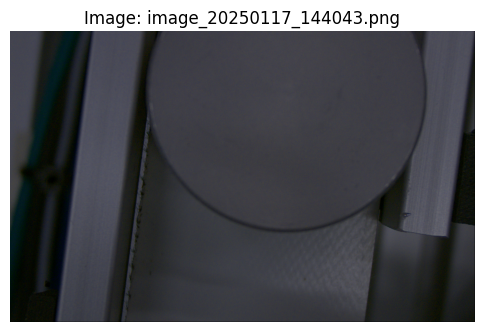

image_20250117_144043.png: Predicted class - Silber


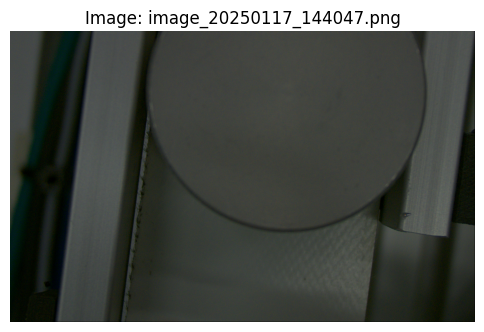

image_20250117_144047.png: Predicted class - Silber


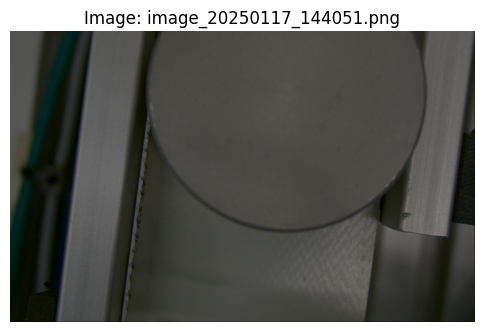

image_20250117_144051.png: Predicted class - Silber


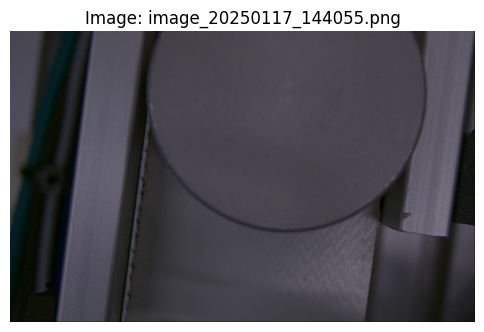

image_20250117_144055.png: Predicted class - Silber


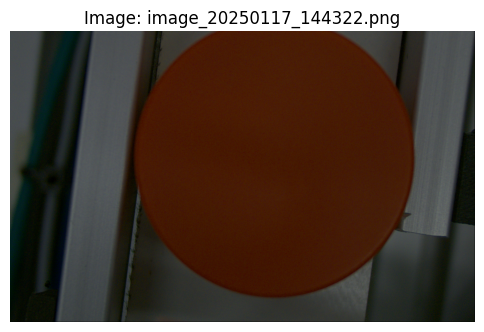

image_20250117_144322.png: Predicted class - Rot


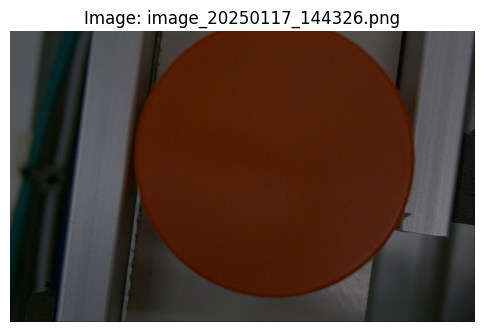

image_20250117_144326.png: Predicted class - Rot


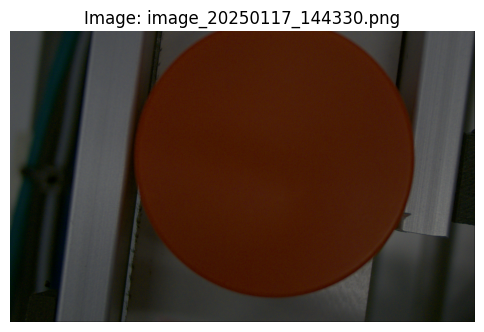

image_20250117_144330.png: Predicted class - Rot


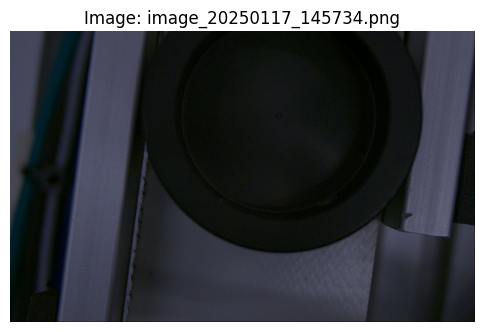

image_20250117_145734.png: Predicted class - Schwarz


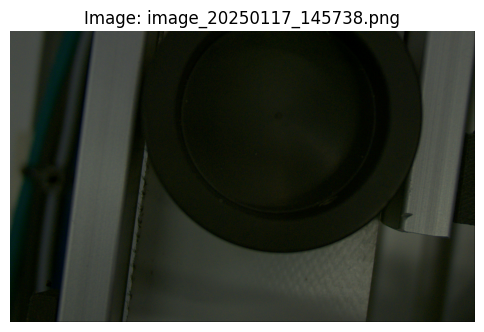

image_20250117_145738.png: Predicted class - Schwarz


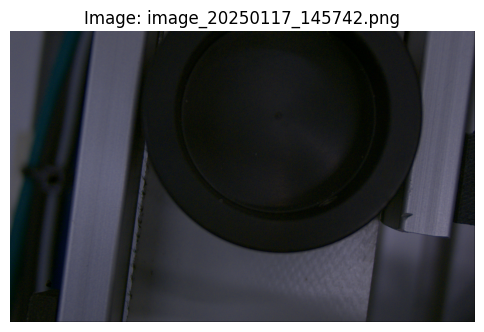

image_20250117_145742.png: Predicted class - Schwarz


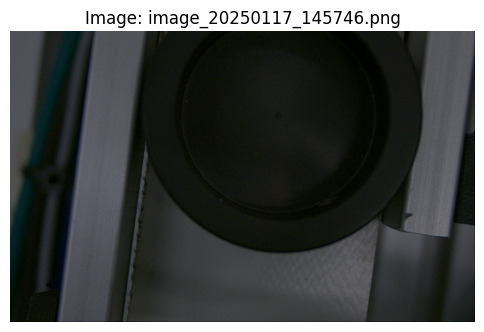

image_20250117_145746.png: Predicted class - Schwarz


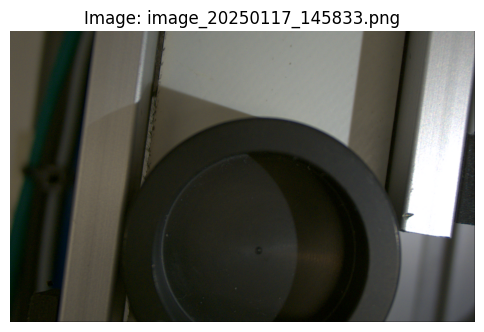

image_20250117_145833.png: Predicted class - Schwarz


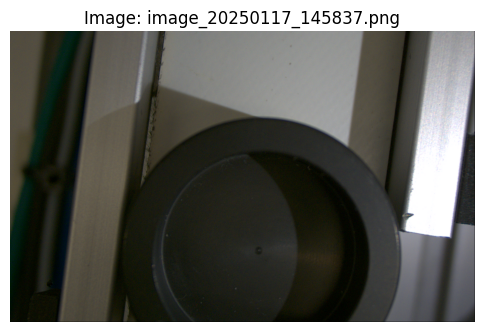

image_20250117_145837.png: Predicted class - Schwarz


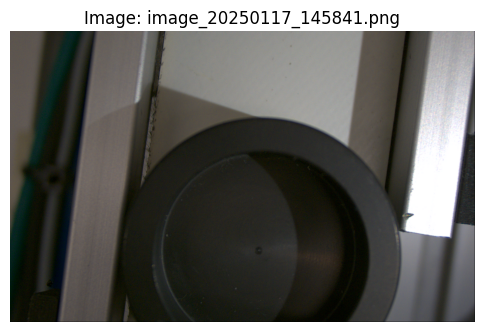

image_20250117_145841.png: Predicted class - Schwarz


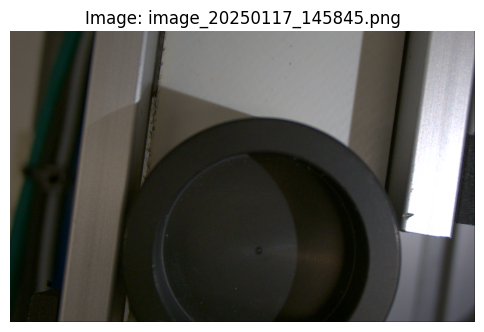

image_20250117_145845.png: Predicted class - Schwarz


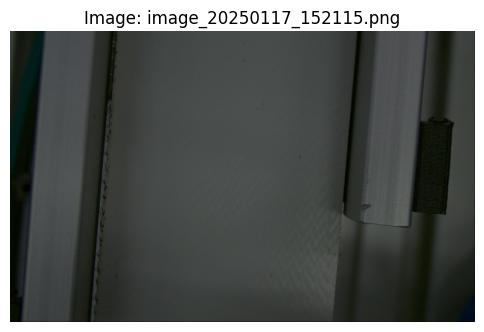

image_20250117_152115.png: Predicted class - Leer


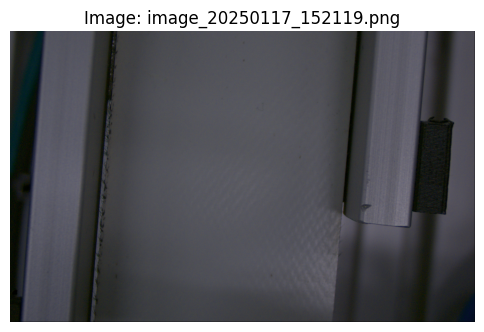

image_20250117_152119.png: Predicted class - Leer


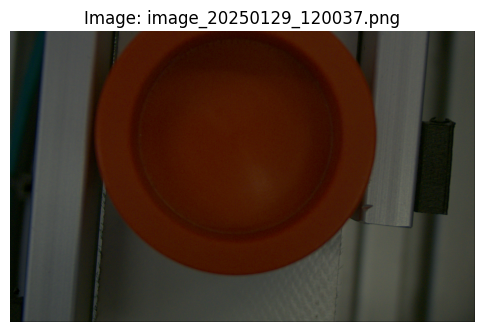

image_20250129_120037.png: Predicted class - Rot


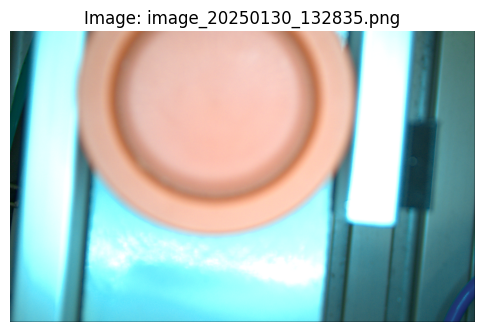

image_20250130_132835.png: Predicted class - Rot


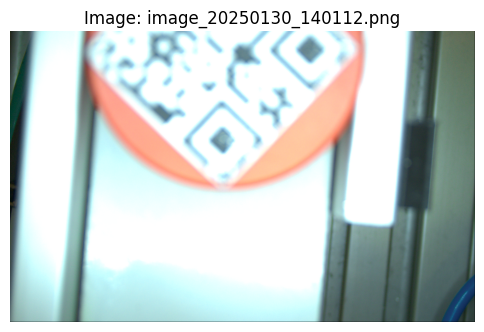

image_20250130_140112.png: Predicted class - Schwarz


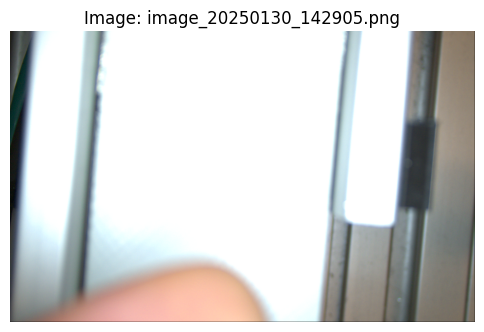

image_20250130_142905.png: Predicted class - Leer


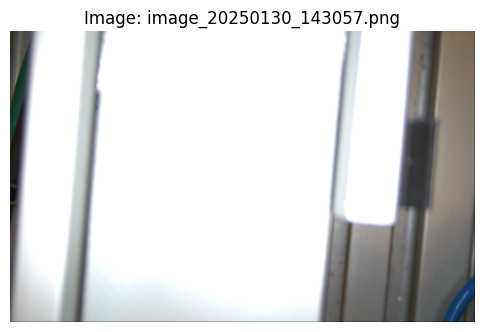

image_20250130_143057.png: Predicted class - Leer


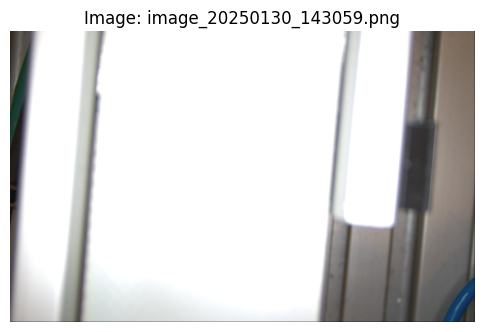

image_20250130_143059.png: Predicted class - Leer


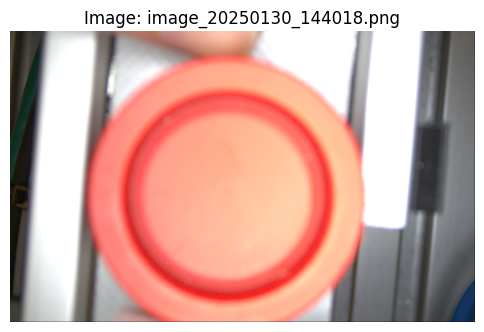

image_20250130_144018.png: Predicted class - Rot


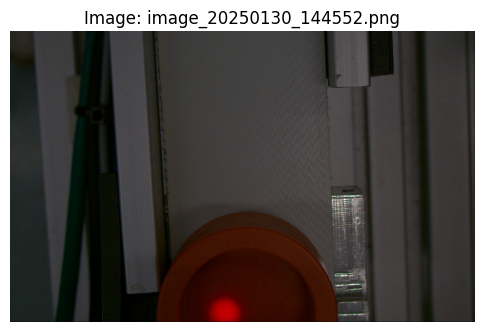

image_20250130_144552.png: Predicted class - Rot


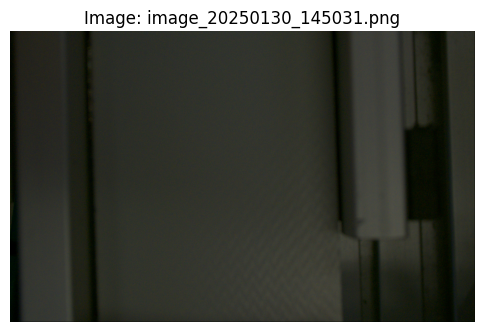

image_20250130_145031.png: Predicted class - Leer


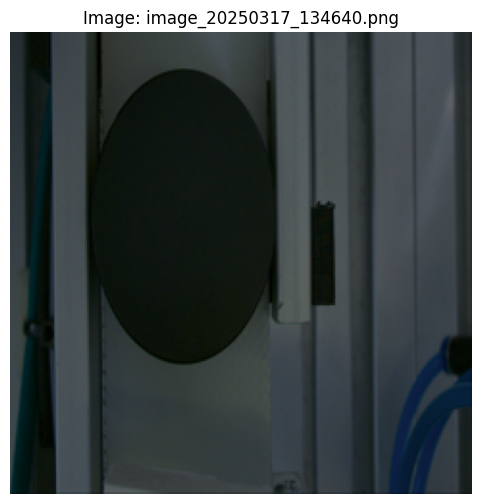

image_20250317_134640.png: Predicted class - Schwarz


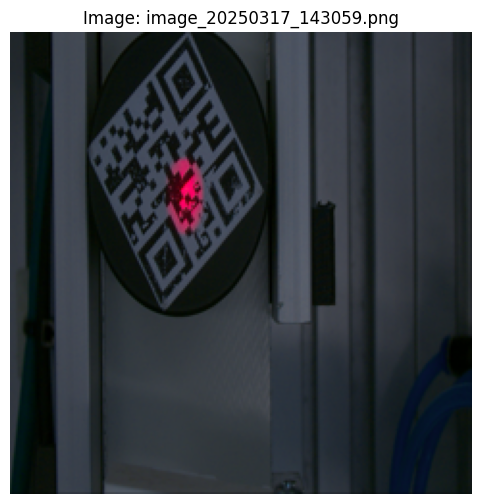

image_20250317_143059.png: Predicted class - Schwarz


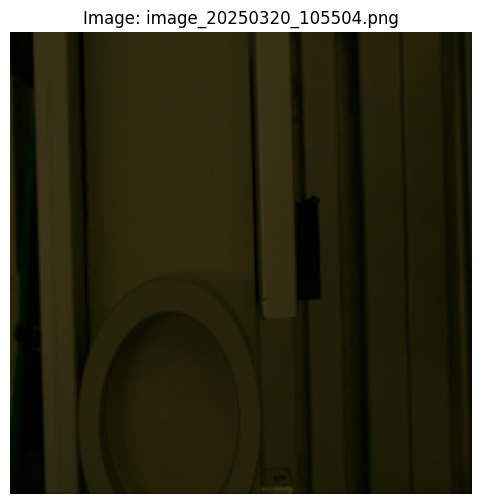

image_20250320_105504.png: Predicted class - Leer


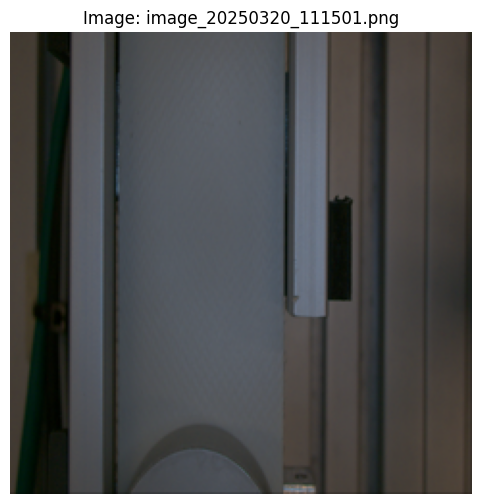

image_20250320_111501.png: Predicted class - Leer


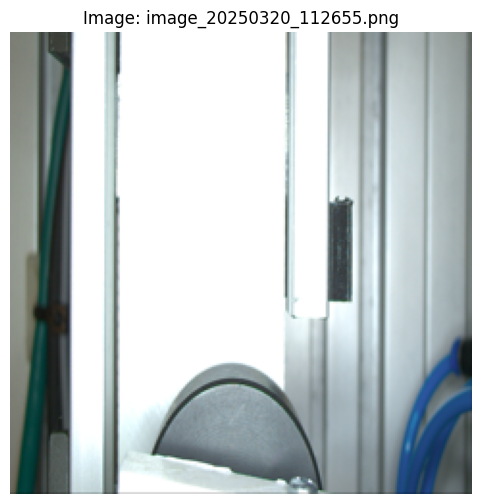

image_20250320_112655.png: Predicted class - Leer


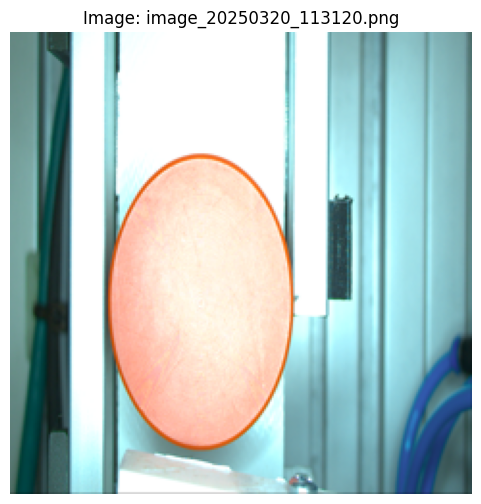

image_20250320_113120.png: Predicted class - Rot


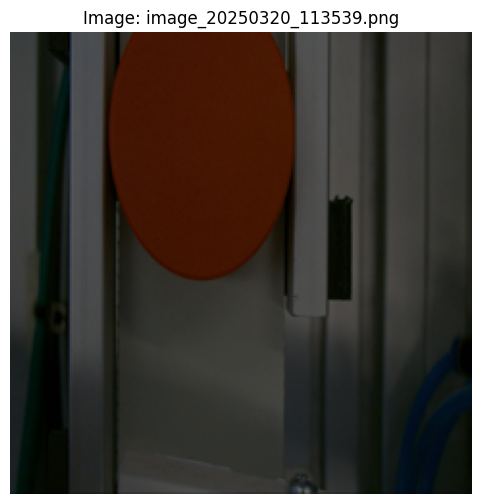

image_20250320_113539.png: Predicted class - Rot


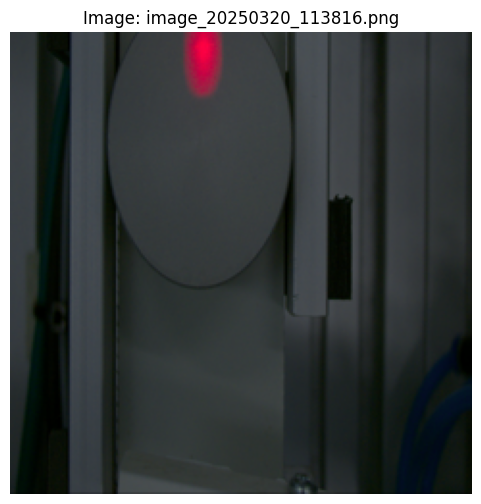

image_20250320_113816.png: Predicted class - Silber


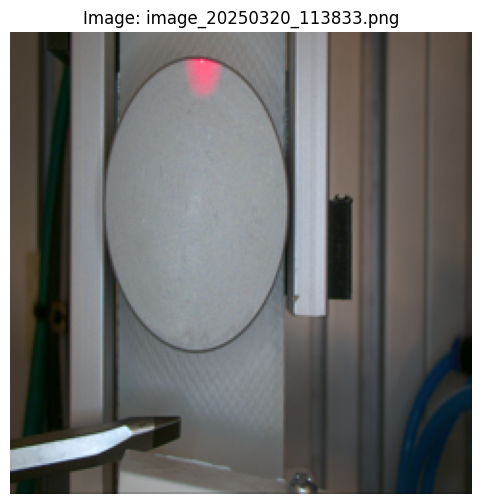

image_20250320_113833.png: Predicted class - Silber


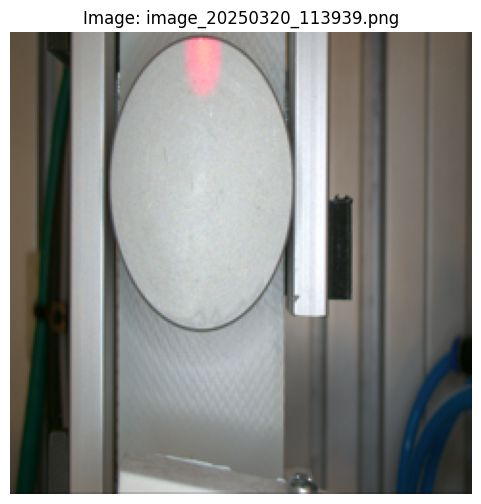

image_20250320_113939.png: Predicted class - Silber


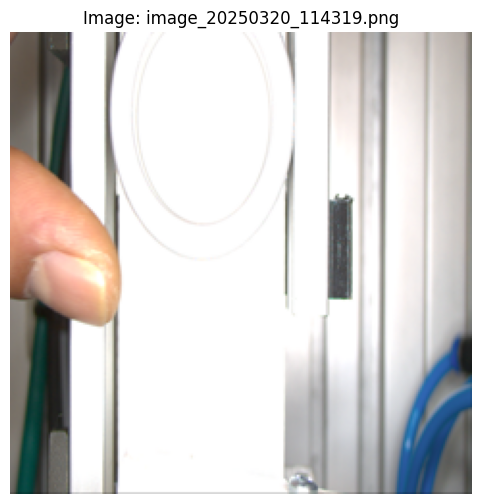

image_20250320_114319.png: Predicted class - Silber


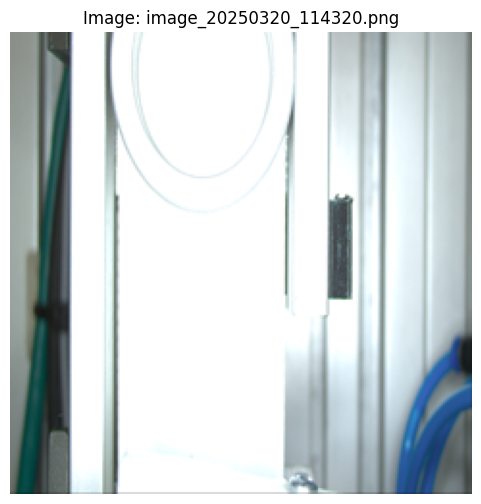

image_20250320_114320.png: Predicted class - Silber


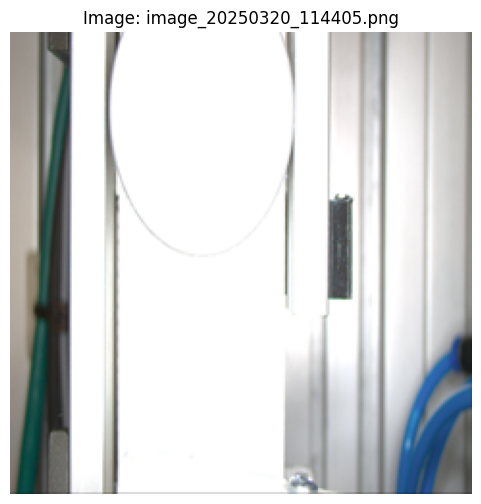

image_20250320_114405.png: Predicted class - Silber


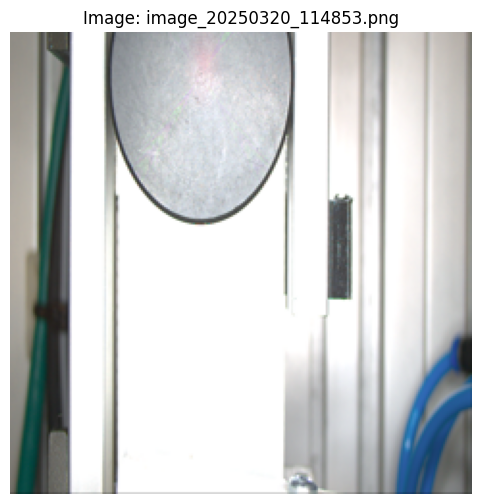

image_20250320_114853.png: Predicted class - Schwarz


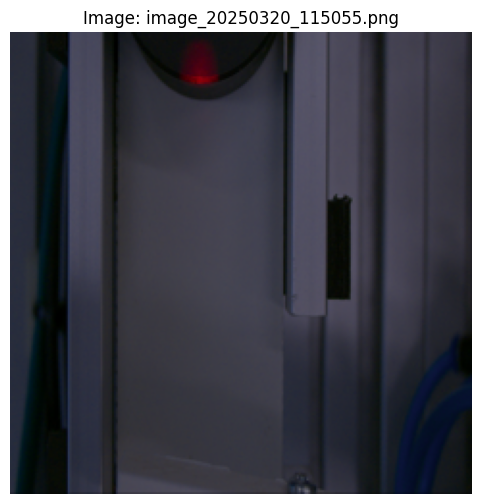

image_20250320_115055.png: Predicted class - Schwarz


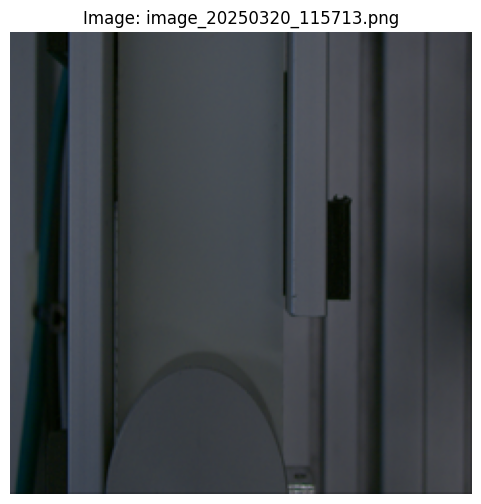

image_20250320_115713.png: Predicted class - Leer

Processed 56 images in 29.65 seconds
Predictions saved to unlabeled_predictions.json
Testing images without labels 2...


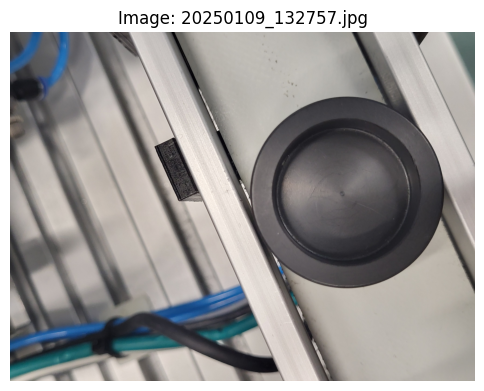

20250109_132757.jpg: Predicted class - Schwarz


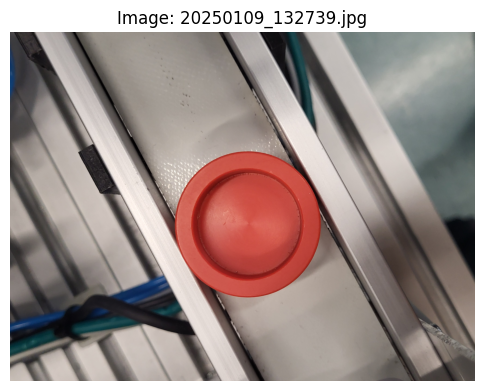

20250109_132739.jpg: Predicted class - Rot


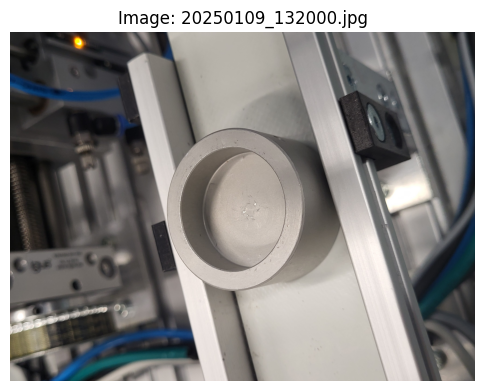

20250109_132000.jpg: Predicted class - Rot


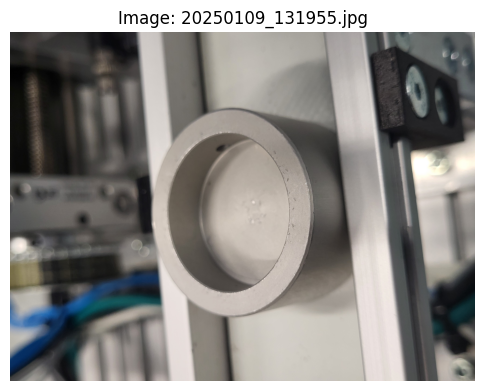

20250109_131955.jpg: Predicted class - Schwarz


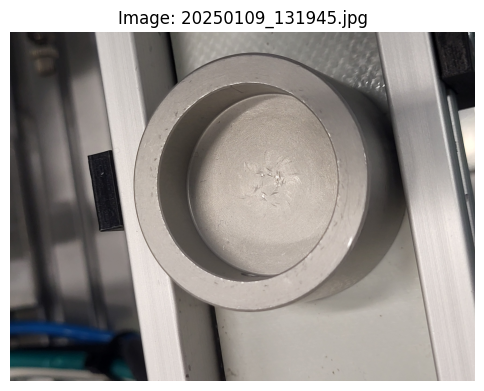

20250109_131945.jpg: Predicted class - Schwarz


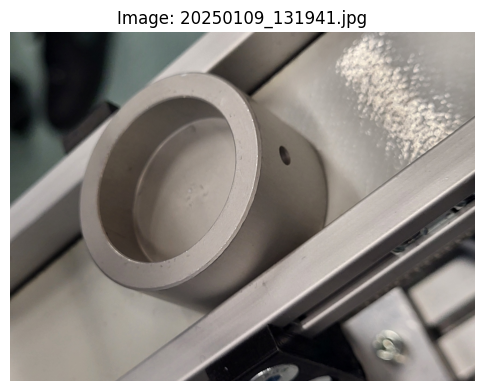

20250109_131941.jpg: Predicted class - Schwarz


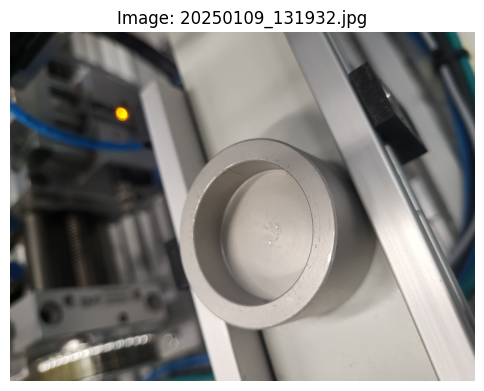

20250109_131932.jpg: Predicted class - Rot


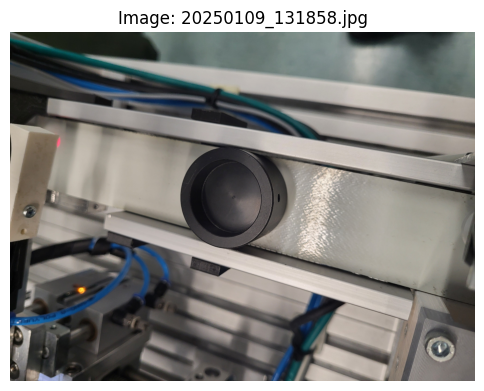

20250109_131858.jpg: Predicted class - Schwarz


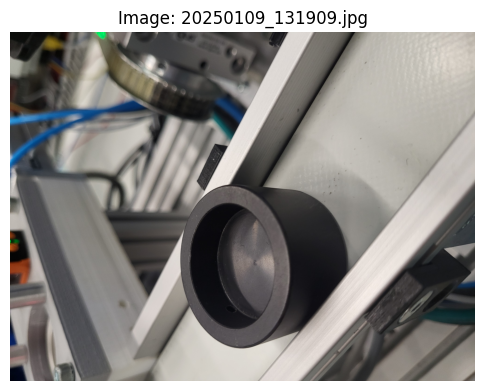

20250109_131909.jpg: Predicted class - Schwarz


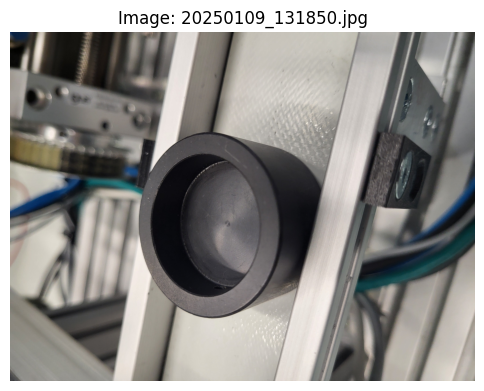

20250109_131850.jpg: Predicted class - Schwarz


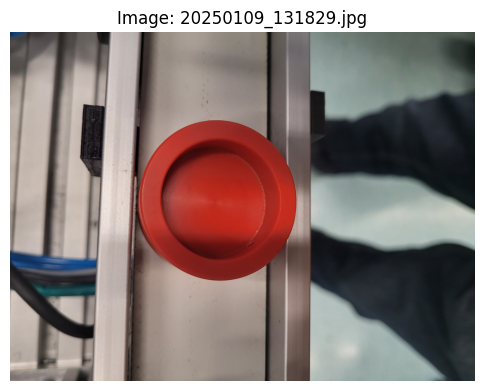

20250109_131829.jpg: Predicted class - Rot


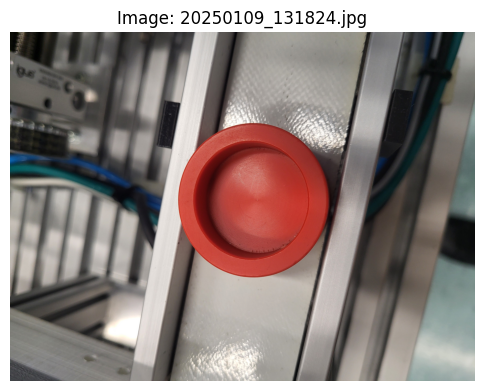

20250109_131824.jpg: Predicted class - Rot

Processed 12 images in 18.13 seconds
Predictions saved to unlabeled_predictions.json


In [ ]:

if __name__ == "__main__":

    while True:
          try:
            num_epochs = int(input("Bitte geben Sie die Anzahl der Trainings-Epochen ein: "))
            if num_epochs <= 0:
                raise ValueError("Die Anzahl der Epochen muss positiv sein.")
            break
          except ValueError as e:
            print(f"Ungültige Eingabe: {e}")


    train()
    test()
    print("Testing images without labels...")
    test_unlabeled_images("/content/drive/MyDrive/IndLab/testUnlabeled")  # Ordner mit Bildern ohne Labels
    print("Testing images without labels 2...")
    test_unlabeled_images("/content/drive/MyDrive/IndLab/testUnlabeled2")
